In [3]:
import imgaug as ia
ia.seed(1)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug import augmenters as iaa 
from PIL import Image
import imageio
import pandas as pd
import numpy as np
import re
import os
import glob

import xml.etree.ElementTree as ET
import shutil

In [4]:
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [5]:
    #setting augmentation params for future aug
    aug = iaa.SomeOf(2, [    
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.Affine(rotate=(-60, 60)),
    iaa.Affine(translate_percent={"x": (-0.3, 0.3), "y": (-0.3, 0.3)}),
    iaa.Fliplr(1),
    iaa.Multiply((0.5, 1.5)),
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

In [6]:
def image_aug(df, images_path, aug_images_path, image_prefix, augmentor):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')
    
    for filename in df['filename'].unique():
    #   get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)   
    #   read the image
        image = imageio.imread(images_path+filename)
    #   get bounding boxes coordinates and write into array        
        bb_array = group_df.drop(['filename', 'width', 'height', 'class', 'is_tent'], axis=1).values
    #   pass the array of bounding boxes coordinates to the imgaug library
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    #   apply augmentation on image and on the bounding boxes
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    #   disregard bounding boxes which have fallen out of image pane    
        bbs_aug = bbs_aug.remove_out_of_image()
    #   clip bounding boxes which are partially outside of image pane
        bbs_aug = bbs_aug.clip_out_of_image()
        
    #   don't perform any actions with the image if there are no bounding boxes left in it    
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass
        
    #   otherwise continue
        else:
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])            
    
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [7]:
def process_folder(folder_path):
    """
    folder path notation needs to be in string format. In jupyter, tab-autocomplete to avoid confusion. Examples: './example/',
    '~/User/my/folder/is/here/'
    
    
    Right now this only works with files of the same pixel size. 
    """
    #starting with a blank image list. We will then append that with each png file.
    
    images = []
    for index, file in enumerate(glob.glob(f'{folder_path}/*.png')):
        images.append(imageio.imread(file))
    print(f'Library contains {len(images)} images')
    
    #now iterating through xml files, pulling out data and placing it in a dataframe
    xml_list = []
    for xml_file in glob.glob(f'{folder_path}*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            contents = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(contents)
            
    #lets user know how many images were processed
    print(f'Processing {len(images)} .xml files') 
    
#     sets up and df
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    df = pd.DataFrame(xml_list, columns=column_name)
    
#     this is the target feature, change as necessary
    df['is_tent'] = (df['class']=='tent').astype(int)
    
    df.to_csv(('./Pete_sample/labels.csv'), index=None)
    print('Successfully converted xml to csv.')


    # get bounding boxes coordinates from grouped data frame and write into array        
    bb_array = group_df.drop(['filename', 'width', 'height', 'class', "is_tent"], axis=1).values

    # pass the array of bounding boxes coordinates to the imgaug library
    for i in images:
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=images[i].shape)
    

    grouped_resized = df.groupby('filename')
    grouped_augmented = augmented_images_df.groupby('filename')

    for filename in df['filename'].unique():    

        group_r_df = grouped_resized.get_group(filename)
        group_r_df = group_r_df.reset_index()
        group_r_df = group_r_df.drop(['index'], axis=1)
        bb_r_array = group_r_df.drop(['filename', 'width', 'height', 'class', 'is_tent'], axis=1).values
        resized_img = imageio.imread('images/'+filename)
        bbs_r = BoundingBoxesOnImage.from_xyxy_array(bb_r_array, shape=resized_img.shape)

        group_a_df = grouped_augmented.get_group('aug1_'+filename)
        group_a_df = group_a_df.reset_index()
        group_a_df = group_a_df.drop(['index'], axis=1)
        bb_a_array = group_a_df.drop(['filename', 'width', 'height', 'class', 'is_tent'], axis=1).values
        augmented_img = imageio.imread('aug_images/'+'aug1_'+filename)
        bbs_a = BoundingBoxesOnImage.from_xyxy_array(bb_a_array, shape=augmented_img.shape)

        ia.imshow(np.hstack([
                bbs_r.draw_on_image(resized_img, size=2),
                bbs_a.draw_on_image(augmented_img, size=2)
                ]))


In [9]:
#run this first
process_folder('./Pete_sample/')

Library contains 4 images


TypeError: only integer scalar arrays can be converted to a scalar index

In [13]:
folder_path = './Pete_sample/'
images = []
for index, file in enumerate(glob.glob(f'{folder_path}/*.png')):
    images.append(imageio.imread(file))
print(f'Library contains {len(images)} images')

#We have to make sure that all images are sliced so that they are [ : : 3]
   

Library contains 4 images


In [16]:
for i in images:
        image_slice = images[i]
        image_slice = image_slice[:,:,:3]
        image_slice = Image.fromarray(image_1_3)
        image_slice.save(f"{folder_path}/sliced_image_{i}.png")
    
print(f'Building dataframe from {folder_path} contents.')

TypeError: only integer scalar arrays can be converted to a scalar index

In [300]:
df = xml_to_csv('./Pete_sample/')

In [301]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,812,829,894,897
1,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,698,802,743,841
2,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,261,590,327,660
3,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,104,203,213,267
4,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,104,276,155,324


In [302]:
df['target'] = (df['class']=='tent').astype(int)

In [305]:
df = process_folder('./Pete_sample/')

Building datafram from ./Pete_sample/ contents.
Processing 2 .xml files


In [306]:
df.to_csv(('./Pete_sample/labels.csv'), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


In [307]:
grouped = df.groupby('filename')

In [308]:
group_df = grouped.get_group('Legoane Haiti 2010 earthq w:lat and long from google earth 1-24-2010.png')
group_df = group_df.reset_index()
group_df = group_df.drop(['index'], axis=1)
group_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,is_tent
0,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,812,829,894,897,1
1,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,698,802,743,841,1
2,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,261,590,327,660,1
3,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,104,203,213,267,1
4,Legoane Haiti 2010 earthq w:lat and long from ...,0,0,tent,104,276,155,324,1


In [309]:
# get bounding boxes coordinates from grouped data frame and write into array        
bb_array = group_df.drop(['filename', 'width', 'height', 'class', "is_tent"], axis=1).values
# display the array we've got
bb_array.shape

(32, 4)

In [310]:
images[(len(images)-1)].shape

(1426, 1736, 3)

In [311]:
images[0].shape

(1426, 1736, 3)

In [312]:
image_1_3 = images[0]
image_1_3 = image_1_3[:,:,:3]
# image_2_3 = images[1]
# image_2_3 = image_2_3[:,:,:3]
# image_3_3 = images[2]
# image_3_3 = image_3_3[:,:,:3]

image_1_3 = Image.fromarray(image_1_3)
image_1_3.save("./Pete_sample/image_1_3.png")
# image_2_3 = Image.fromarray(image_2_3)
# image_2_3.save("image_2_3.png")
# image_3_3 = Image.fromarray(image_3_3)
# image_3_3.save("image_3_3.png")

In [1]:
bbs

NameError: name 'bbs' is not defined

In [2]:
# pass the array of bounding boxes coordinates to the imgaug library
bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=images[0].shape)
# display the image and draw bounding boxes
ia.imshow(bbs.draw_on_image(images[0], size = 5))

NameError: name 'BoundingBoxesOnImage' is not defined

In [314]:
bb_array.shape

(32, 4)

In [315]:
# height_resize = iaa.Sequential([ 
#     iaa.Resize({"height": 600, "width": 'keep-aspect-ratio'})
# ])

# width_resize = iaa.Sequential([ 
#     iaa.Resize({"height": 'keep-aspect-ratio', "width": 600})
# ])

In [316]:
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [317]:
# def resize_imgaug(df, images_path, aug_images_path, image_prefix):
#     # create data frame which we're going to populate with augmented image info
#     aug_bbs_xy = pd.DataFrame(columns=
#                               ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
#                              )
#     grouped = df.groupby('filename')    
    
#     for filename in df['filename'].unique():
#     #   Get separate data frame grouped by file name
#         group_df = grouped.get_group(filename)
#         group_df = group_df.reset_index()
#         group_df = group_df.drop(['index'], axis=1)
        
#     #   The only difference between if and elif statements below is the use of height_resize and width_resize augmentors
#     #   deffined previously.

#     #   If image height is greater than or equal to image width 
#     #   AND greater than 600px perform resizing augmentation shrinking image height to 600px.
#         if group_df['height'].unique()[0] >= group_df['width'].unique()[0] and group_df['height'].unique()[0] > 600:
#         #   read the image
#             image = imageio.imread(images_path+filename)
#         #   get bounding boxes coordinates and write into array        
#             bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
#         #   pass the array of bounding boxes coordinates to the imgaug library
#             bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
#         #   apply augmentation on image and on the bounding boxes
#             image_aug, bbs_aug = height_resize(image=image, bounding_boxes=bbs)
#         #   write augmented image to a file
#             imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
#         #   create a data frame with augmented values of image width and height
#             info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
#             for index, _ in info_df.iterrows():
#                 info_df.at[index, 'width'] = image_aug.shape[1]
#                 info_df.at[index, 'height'] = image_aug.shape[0]
#         #   rename filenames by adding the predifined prefix
#             info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
#         #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
#             bbs_df = bbs_obj_to_df(bbs_aug)
#         #   concat all new augmented info into new data frame
#             aug_df = pd.concat([info_df, bbs_df], axis=1)
#         #   append rows to aug_bbs_xy data frame
#             aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])
            
#     #   if image width is greater than image height 
#     #   AND greater than 600px perform resizing augmentation shrinking image width to 600px
#         elif group_df['width'].unique()[0] > group_df['height'].unique()[0] and group_df['width'].unique()[0] > 600:
#         #   read the image
#             image = imageio.imread(images_path+filename)
#         #   get bounding boxes coordinates and write into array        
#             bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
#         #   pass the array of bounding boxes coordinates to the imgaug library
#             bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
#         #   apply augmentation on image and on the bounding boxes
#             image_aug, bbs_aug = width_resize(image=image, bounding_boxes=bbs)
#         #   write augmented image to a file
#             imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
#         #   create a data frame with augmented values of image width and height
#             info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
#             for index, _ in info_df.iterrows():
#                 info_df.at[index, 'width'] = image_aug.shape[1]
#                 info_df.at[index, 'height'] = image_aug.shape[0]
#         #   rename filenames by adding the predifined prefix
#             info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
#         #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
#             bbs_df = bbs_obj_to_df(bbs_aug)
#         #   concat all new augmented info into new data frame
#             aug_df = pd.concat([info_df, bbs_df], axis=1)
#         #   append rows to aug_bbs_xy data frame
#             aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])

#     #     append image info without any changes if it's height and width are both less than 600px 
#         else:
#             aug_bbs_xy = pd.concat([aug_bbs_xy, group_df])
#     # return dataframe with updated images and bounding boxes annotations 
#     aug_bbs_xy = aug_bbs_xy.reset_index()
#     aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
#     return aug_bbs_xy

In [318]:
# resized_images_df = resize_imgaug(df, './Pete_sample/', './Pete_sample/', 'image')

In [319]:
# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [320]:
aug = iaa.SomeOf(2, [    
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.Affine(rotate=(-60, 60)),
    iaa.Affine(translate_percent={"x": (-0.3, 0.3), "y": (-0.3, 0.3)}),
    iaa.Fliplr(1),
    iaa.Multiply((0.5, 1.5)),
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

In [329]:
def image_aug(df, images_path, aug_images_path, image_prefix, augmentor):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')
    
    for filename in df['filename'].unique():
    #   get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)   
    #   read the image
        image = imageio.imread(images_path+filename)
    #   get bounding boxes coordinates and write into array        
        bb_array = group_df.drop(['filename', 'width', 'height', 'class', 'is_tent'], axis=1).values
    #   pass the array of bounding boxes coordinates to the imgaug library
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    #   apply augmentation on image and on the bounding boxes
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    #   disregard bounding boxes which have fallen out of image pane    
        bbs_aug = bbs_aug.remove_out_of_image()
    #   clip bounding boxes which are partially outside of image pane
        bbs_aug = bbs_aug.clip_out_of_image()
        
    #   don't perform any actions with the image if there are no bounding boxes left in it    
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass
        
    #   otherwise continue
        else:
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])            
    
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [332]:
augmented_images_df = image_aug(df, './Pete_sample/', './Pete_sample/', 'aug1_', aug)

In [323]:
df['filename'] = 'Legoane Haiti 1.png'

In [333]:
augmented_images_df

,filename,width,height,class,xmin,ymin,xmax,ymax,is_tent
0,aug1_Legoane Haiti 1.png,1736,1426,tent,930.803894,758.332214,1033.563843,864.513367,1.0
1,aug1_Legoane Haiti 1.png,1736,1426,tent,843.231567,866.443298,901.001953,925.679932,1.0
2,aug1_Legoane Haiti 1.png,1736,1426,tent,418.713623,1085.254761,513.922363,1179.486084,1.0
3,aug1_Legoane Haiti 1.png,1736,1426,tent,11.731397,956.332581,126.722504,1082.320190,1.0
4,aug1_Legoane Haiti 1.png,1736,1426,tent,71.493172,1045.737427,140.077194,1115.054565,1.0
5,aug1_Legoane Haiti 1.png,1736,1426,tent,107.013382,1001.859985,183.942764,1075.368286,1.0
6,aug1_Legoane Haiti 1.png,1736,1426,tent,766.071838,524.011902,835.474487,593.903320,1.0
7,aug1_Legoane Haiti 1.png,1736,1426,tent,1462.724365,558.350586,1630.060669,732.284851,1.0
8,aug1_Legoane Haiti 1.png,1736,1426,tent,889.945312,609.739441,974.560181,685.312744,1.0
9,aug1_Legoane Haiti 1.png,1736,1426,tent,783.189880,623.228394,858.384094,690.114075,1.0


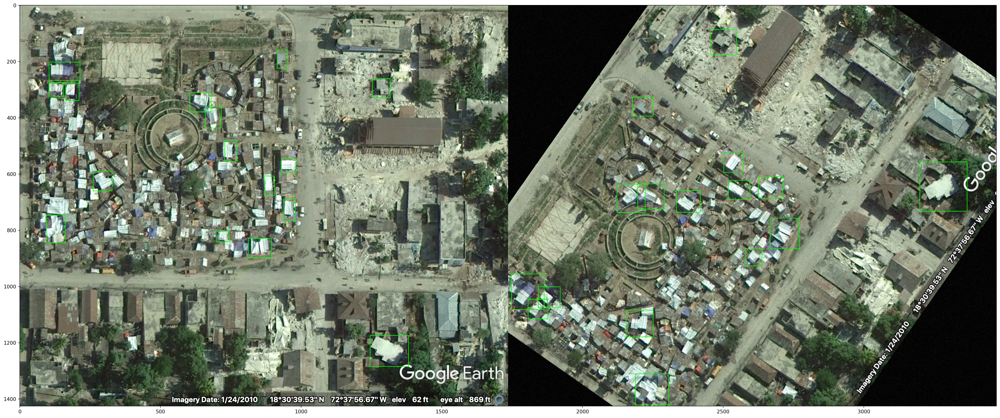

In [339]:
grouped_resized = df.groupby('filename')
grouped_augmented = augmented_images_df.groupby('filename')

for filename in df['filename'].unique():    
    
    group_r_df = grouped_resized.get_group(filename)
    group_r_df = group_r_df.reset_index()
    group_r_df = group_r_df.drop(['index'], axis=1)
    bb_r_array = group_r_df.drop(['filename', 'width', 'height', 'class', 'is_tent'], axis=1).values
    resized_img = imageio.imread('images/'+filename)
    bbs_r = BoundingBoxesOnImage.from_xyxy_array(bb_r_array, shape=resized_img.shape)
    
    group_a_df = grouped_augmented.get_group('aug1_'+filename)
    group_a_df = group_a_df.reset_index()
    group_a_df = group_a_df.drop(['index'], axis=1)
    bb_a_array = group_a_df.drop(['filename', 'width', 'height', 'class', 'is_tent'], axis=1).values
    augmented_img = imageio.imread('aug_images/'+'aug1_'+filename)
    bbs_a = BoundingBoxesOnImage.from_xyxy_array(bb_a_array, shape=augmented_img.shape)
    
    ia.imshow(np.hstack([
            bbs_r.draw_on_image(resized_img, size=2),
            bbs_a.draw_on_image(augmented_img, size=2)
            ]))